## Imports
Warning about the drive adress, to be change for an other drive

In [1]:
!pip install bm3d

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 45.3 MB/s eta 0:00:00


In [2]:
import argparse
from glob import glob
import os
import numpy as np
import torch
import matplotlib.pyplot as plt
import tqdm as tqdm
from scipy import signal
from bm3d import bm3d, BM3DProfile

In [3]:
from google.colab import drive, files
drive.mount('/content/drive',  force_remount=True)

Mounted at /content/drive


In [4]:
#chemin pour le drive de Marien -> à changer pour Emeric
%cd /content/drive/MyDrive/Colab_Notebooks/Projet_Remote_Sensing
# %cd /content/drive/MyDrive/Projet_Remote_Sensing/

/content/drive/MyDrive/Colab_Notebooks/Projet_Remote_Sensing


In [5]:
#imports all utils function
from Dataset import *
from model import *
from utils import *
#to be change
# rootdir = '/content/drive/MyDrive/Projet_Remote_Sensing/'
rootdir = '/content/drive/MyDrive/Colab_Notebooks/Projet_Remote_Sensing/'
basedir = rootdir + 'SAR-CNN-U-Net_with_test'
datasetdir = rootdir + 'PRAT/data'

In [6]:
checkpoint = torch.load('models/model.pth')

In [7]:
#the .pth contain all the weight of the model
checkpoint.keys()

odict_keys(['enc0.weight', 'enc0.bias', 'enc1.weight', 'enc1.bias', 'enc2.weight', 'enc2.bias', 'enc3.weight', 'enc3.bias', 'enc4.weight', 'enc4.bias', 'enc5.weight', 'enc5.bias', 'enc6.weight', 'enc6.bias', 'dec5.weight', 'dec5.bias', 'dec5b.weight', 'dec5b.bias', 'dec4.weight', 'dec4.bias', 'dec4b.weight', 'dec4b.bias', 'dec3.weight', 'dec3.bias', 'dec3b.weight', 'dec3b.bias', 'dec2.weight', 'dec2.bias', 'dec2b.weight', 'dec2b.bias', 'dec1a.weight', 'dec1a.bias', 'dec1b.weight', 'dec1b.bias', 'dec1.weight', 'dec1.bias'])

In [8]:

#parameters of the model
batch_size = 12
val_batch_size = 1
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

model = AE(batch_size,val_batch_size,device)
#put the learning weights on the model
model.load_state_dict(checkpoint)

<All keys matched successfully>

In [9]:
# Import ratio model
checkpoint = torch.load('models/model_ratio.pth')

#parameters of the model
batch_size = 12
val_batch_size = 1
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

model_ratio = AE(batch_size,val_batch_size,device)

#put the learning weights on the model
model_ratio.load_state_dict(checkpoint)

<All keys matched successfully>

In [10]:
#create a class for BM3D denoiser
class BM3DDenoiser:
    def __init__(self,
        sigma = 40,                  # Noise stdev for an 8-bit image in [0,255]
        rescale = False):             # If true rescale [min,max] to [0,1] before applying denoiser
        self.sigma = sigma/255.0
        self.rescale = rescale
    def denoise(self,xtilde):
        """
        Inputs:
            :xtilde     noisy image
        Outputs:
            :x          denoised image
        """
        # scale xtilde to be in range of [0,1] (for the clean image)
        if self.rescale:
            mintmp = np.min(xtilde)
            #mintmp = 0.0
            maxtmp = np.max(xtilde)
            #maxtmp = 255.0
            xtilde = (xtilde - mintmp) / (maxtmp - mintmp)

        # upgrade to 3D tensor
        xtildeBM3D = np.atleast_3d(xtilde)
        x = bm3d(xtildeBM3D,self.sigma)

        # rescale the denoised v back to original scale
        if self.rescale:
            x = x * (maxtmp - mintmp) + mintmp

        return x

# Test of the model

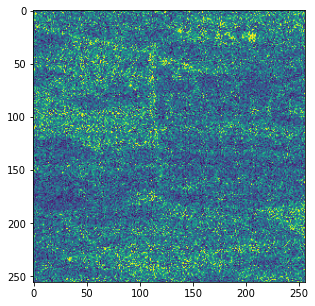

In [11]:
#an example or a noisy image of the test set
im = np.load('data/test/noisy/marais2_10_0.npy')
im = threshold(im, 'marais1')

plt.figure(figsize=(5,5))
plt.imshow(im)
plt.show()

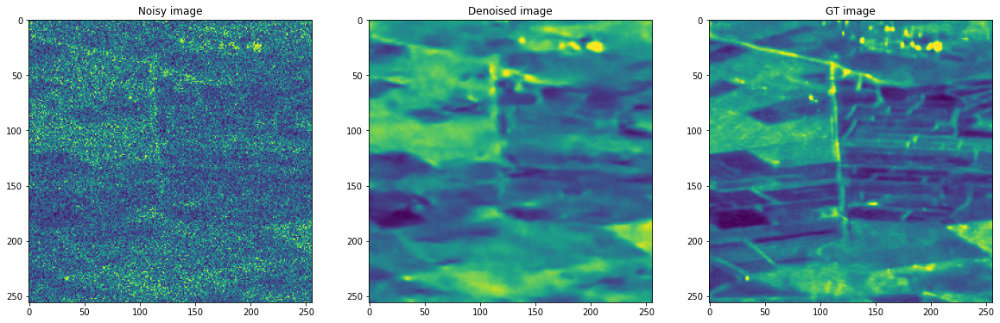

In [12]:
im = np.load('data/test/noisy/marais2_10_0.npy')
im = threshold(im, '')
im_denoised = denoiser_256(im, model)
im_denoised = threshold(im_denoised, '')
im_gt = np.load('data/test/groundtruth/marais2_10_0.npy')
im_gt = threshold(im_gt, '')

fig, axs = plt.subplots(1, 3, figsize = (20,10))
axs[0].imshow(im)
axs[0].set_title('Noisy image')
axs[1].imshow(im_denoised)
axs[1].set_title('Denoised image')
axs[2].imshow(im_gt)
axs[2].set_title('GT image')

plt.show()

Text(0.5, 1.0, 'GT image')

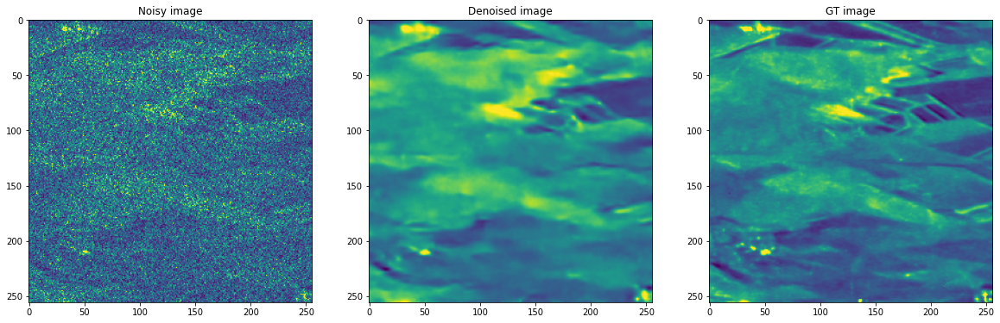

In [13]:
im = np.load('data/test/noisy/marais2_10_1.npy')
im = threshold(im, '')
im_denoised = denoiser_256(im, model)
im_denoised = threshold(im_denoised, '')
im_gt = np.load('data/test/groundtruth/marais2_10_1.npy')
im_gt = threshold(im_gt, '')

fig, axs = plt.subplots(1, 3, figsize = (20,10))
axs[0].imshow(im)
axs[0].set_title('Noisy image')
axs[1].imshow(im_denoised)
axs[1].set_title('Denoised image')
axs[2].imshow(im_gt)
axs[2].set_title('GT image')

# SARtoSAR with ratio and SARratiotoSARratio
We denoise ratio image with the SARtoSAR model (with a good normalization) or with the SARratiotoSARratio model.

## Create dataset

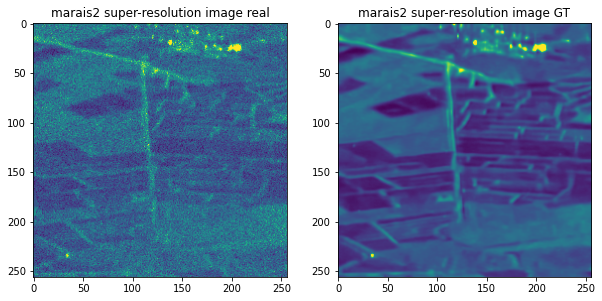

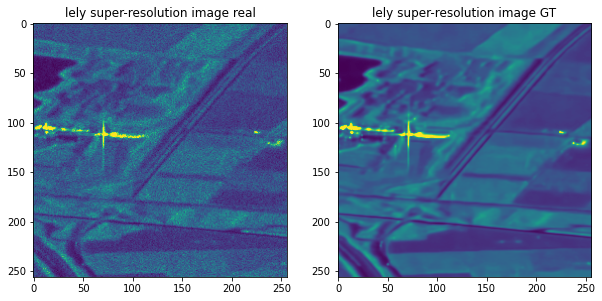

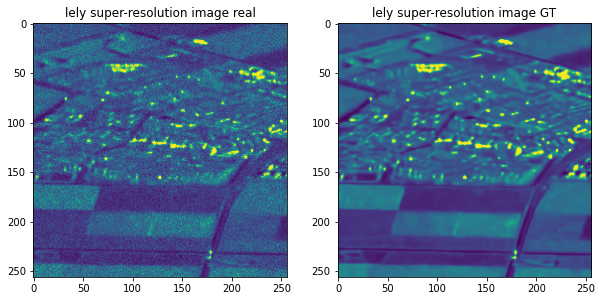

In [35]:
#Computation of ratio image with speckle and plot of the mean image -> super-resolution image
list_im = ['marais2', 'lely', 'lely']# 'limagne'}
im_location = np.array([[0,0],[0,0],[500,2150]])

super_image_list = []
super_image_gt_list = []
Im_gt_list = []
Im_ratio_list = []
Im_ratio_gt_list = []
Im_noisy_list = []

i_begin = 21
i_end = 31

for k, short_name in enumerate(list_im):
  Im_ratio = []
  Im_noisy = []
  Im_gt = []

  for i in range(i_begin,i_end):
    #very important to do it on additional data otherwise we use the model on his train data
    name = rootdir + 'data/additional_data/'+short_name+'_'+str(i)+'.npy'
    im = np.load(name)
    im = im[im_location[k,0]:im_location[k,0]+256,im_location[k,1]:im_location[k,1]+256]
    Im_ratio.append(im)
    Im_noisy.append(im)
    Im_gt.append(im)

  Im_ratio = torch.tensor(Im_ratio)
  Im_noisy = torch.tensor(Im_noisy)
  Im_gt = np.array(Im_gt)

  #add speckle to each image (independant for each one)
  for i in range(i_end - i_begin):
    Im_ratio[i] = inverse_normalized_SAR(generate_speckle(normalized_SAR(Im_ratio[i]),L=1))#L= 1, one observation for each image
    Im_noisy[i] = Im_ratio[i]

  super_image = torch.mean(Im_ratio, axis=0)
  super_image_gt = np.mean(Im_gt, axis=0)

  #plot the super-resolue image
  super_image_thresh = threshold(super_image.detach().numpy(), short_name)
  super_image_gt_thresh = threshold(super_image_gt, short_name)

  plt.figure(figsize=(10,10))
  
  plt.subplot(121)
  plt.imshow(super_image_thresh)
  plt.title(short_name+' super-resolution image real')
  plt.subplot(122)
  plt.imshow(super_image_gt_thresh)
  plt.title(short_name+' super-resolution image GT')
  plt.show()

  Im_ratio_gt = Im_ratio / super_image_gt[None,:,:]
  Im_ratio = Im_ratio / super_image[None,:,:]

  super_image_list.append(super_image)
  super_image_gt_list.append(super_image_gt)
  Im_gt_list.append(Im_gt)
  Im_ratio_list.append(Im_ratio)
  Im_ratio_gt_list.append(Im_ratio_gt)
  Im_noisy_list.append(Im_noisy)

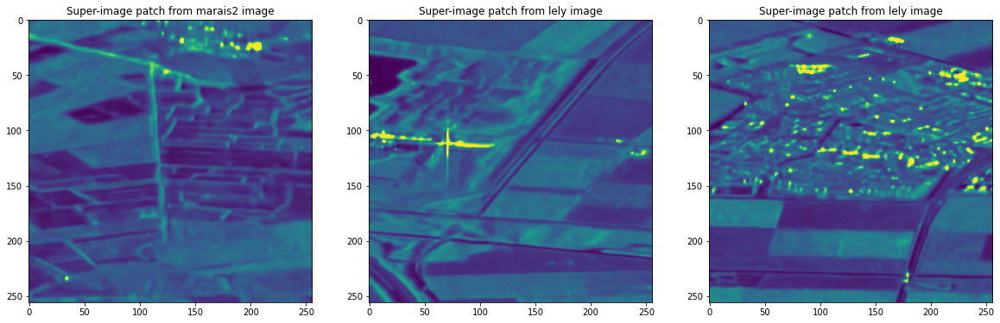

In [36]:
fig, axs = plt.subplots(1, 3, figsize = (20,20))

axs[0].imshow(threshold(super_image_gt_list[0], 'marais2'))
axs[0].set_title('Super-image patch from marais2 image')

axs[1].imshow(threshold(super_image_gt_list[1], 'lely'))
axs[1].set_title('Super-image patch from lely image')

axs[2].imshow(threshold(super_image_gt_list[2], 'lely'))
axs[2].set_title('Super-image patch from lely image')

plt.show()

## Denoise with gt ratio

In [37]:
#i can be change in the three test images, name is for the threshold to show images
i = 0
if i ==0:
  name = 'marais2'
if i ==1 or i ==2:
  name = 'lely'

super_image = super_image_list[i]
super_image_gt = super_image_gt_list[i]
Im_gt = Im_gt_list[i]
Im_ratio = Im_ratio_list[i]
Im_ratio_gt = Im_ratio_gt_list[i]
Im_noisy = Im_noisy_list[i]

In [38]:
#idx : to choose each image of the stack we look
idx = 0

# Choose an image
im_noisy = Im_noisy[idx,:,:].detach().numpy().astype(np.float32)
im_gt = Im_gt[idx,:,:]
im_ratio_gt = Im_ratio_gt[idx,:,:].detach().numpy().astype(np.float32)

# Denoising
im_lee = Lee_filter(im_noisy, L = 1, size_window = 4)
im_sartosar = denoiser_256(im_noisy, model)
im_sartosar_with_ratio = sar_to_sar_with_ratio(im_noisy, super_image_gt, model)
im_ratiosar =  sarratio_to_sarratio(im_noisy, super_image_gt, model_ratio)

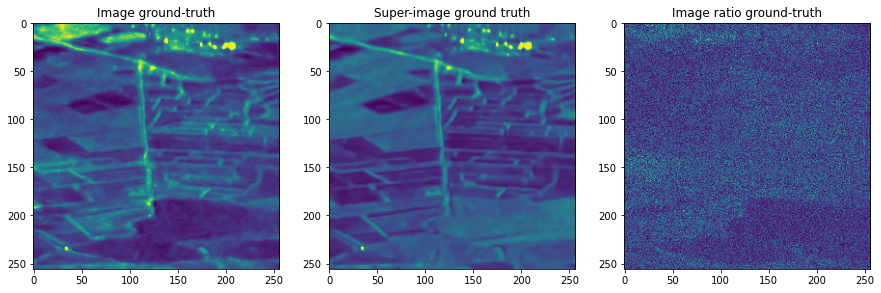

In [78]:
fig, axs = plt.subplots(1, 3, figsize = (15,5))

axs[0].imshow(threshold(im_gt,name))
axs[0].set_title('Image ground-truth')

axs[1].imshow(threshold(super_image_gt, name))
axs[1].set_title('Super-image ground truth')

axs[2].imshow(threshold(im_ratio_gt, name))
axs[2].set_title('Image ratio ground-truth')

plt.show()

In [39]:
# Get thresholded images
im_noisy_th = threshold(im_noisy, name)
im_sar_with_ratio_th = threshold(im_sartosar_with_ratio, name)
im_ratiosar_th = threshold(im_ratiosar, name)
im_sar_th = threshold(im_sartosar, name)
im_gt_th = threshold(im_gt, name)

# Compute PSNR
psnr_lee = cal_psnr(im_lee, im_gt)
psnr_noisy = cal_psnr(im_noisy, im_gt)
psnr_sar_with_ratio = cal_psnr(im_sartosar_with_ratio, im_gt)
psnr_ratiosar = cal_psnr(im_ratiosar, im_gt)
psnr_sar = cal_psnr(im_sartosar, im_gt)

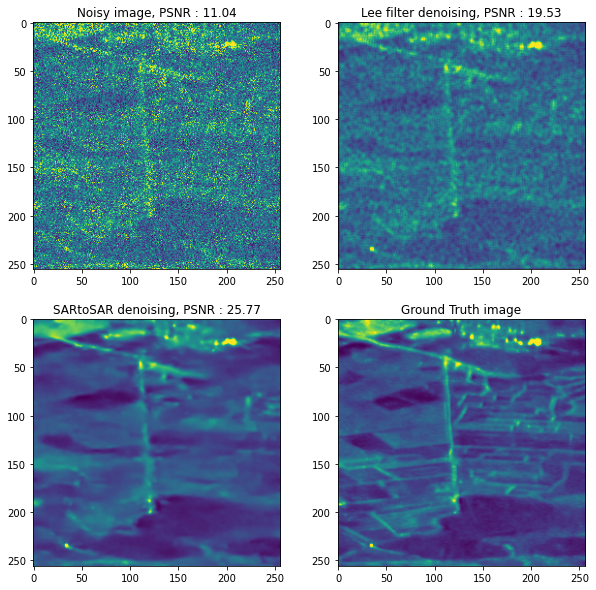

In [40]:
fig, axs = plt.subplots(2, 2, figsize = (10,10))

axs[0,0].imshow(im_noisy_th)
axs[0,0].set_title('Noisy image, PSNR : '+str(psnr_noisy)[:5])

axs[0,1].imshow(threshold(im_lee, name))
axs[0,1].set_title('Lee filter denoising, PSNR : '+str(psnr_lee)[:5])

axs[1,0].imshow(im_sar_th)
axs[1,0].set_title('SARtoSAR denoising, PSNR : '+str(psnr_sar)[:5])

axs[1,1].imshow(im_gt_th)
axs[1,1].set_title('Ground Truth image')
plt.show()

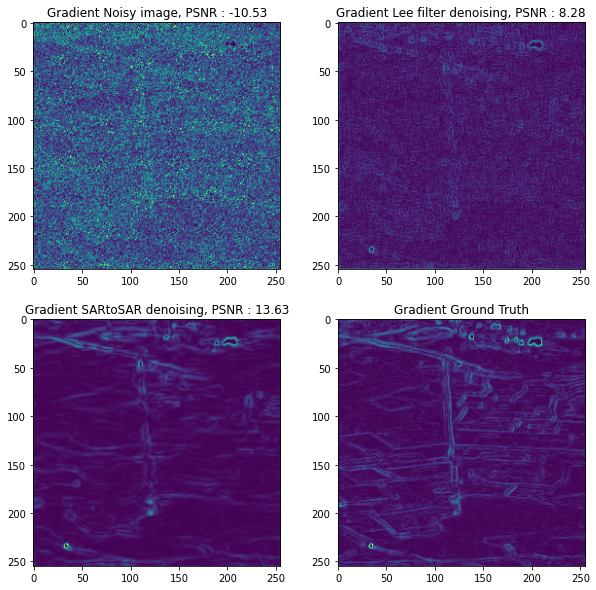

In [41]:
fig, axs = plt.subplots(2, 2, figsize = (10,10))

axs[0,0].imshow(gradn(im_noisy_th))
axs[0,0].set_title('Gradient Noisy image, PSNR : '+str(cal_psnr(gradn(im_noisy), gradn(im_gt)))[:6])

axs[0,1].imshow(gradn(threshold(im_lee, name)))
axs[0,1].set_title('Gradient Lee filter denoising, PSNR : '+str(cal_psnr(gradn(im_lee), gradn(im_gt)))[:4])

axs[1,0].imshow(gradn(im_sar_th))
axs[1,0].set_title('Gradient SARtoSAR denoising, PSNR : '+str(cal_psnr(gradn(im_sartosar), gradn(im_gt)))[:5])

axs[1,1].imshow(gradn(im_gt_th))
axs[1,1].set_title('Gradient Ground Truth')
plt.show()

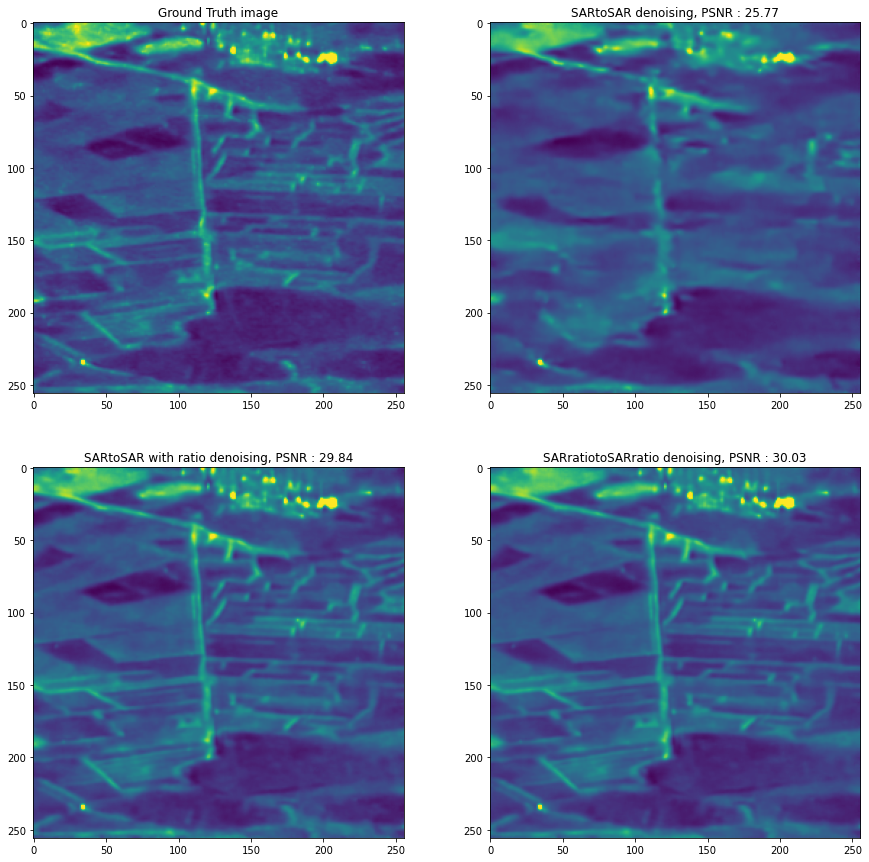

In [42]:
fig, axs = plt.subplots(2, 2, figsize = (15,15))

axs[0,0].imshow(im_gt_th)
axs[0,0].set_title('Ground Truth image')

axs[0,1].imshow(im_sar_th)
axs[0,1].set_title('SARtoSAR denoising, PSNR : '+str(psnr_sar)[:5])

axs[1,0].imshow(im_sar_with_ratio_th)
axs[1,0].set_title('SARtoSAR with ratio denoising, PSNR : '+str(psnr_sar_with_ratio)[:5])

axs[1,1].imshow(im_ratiosar_th)
axs[1,1].set_title('SARratiotoSARratio denoising, PSNR : '+str(psnr_ratiosar)[:5])

plt.show()

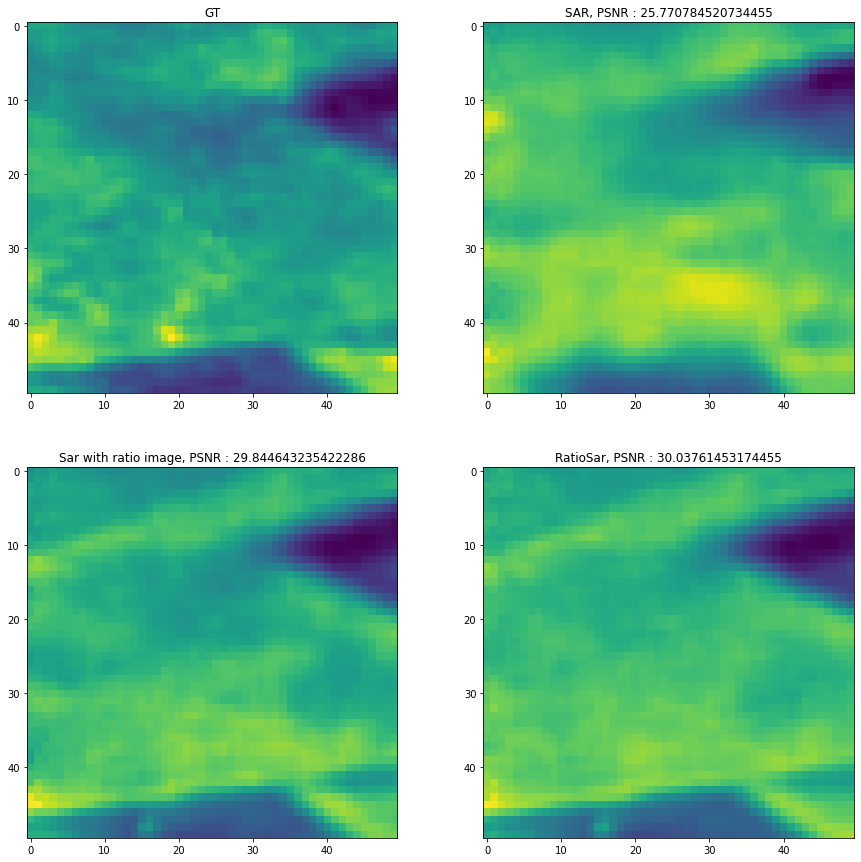

In [43]:
#Zoom on patch of size 50*50

a = 75
b = 125
c = 0
d = 50

fig, axs = plt.subplots(2, 2, figsize = (15,15))

axs[0,0].imshow(im_gt_th[a:b,c:d])
axs[0,0].set_title('GT')

axs[0,1].imshow(im_sar_th[a:b,c:d])
axs[0,1].set_title('SAR, PSNR : '+str(psnr_sar))

axs[1,0].imshow(im_sar_with_ratio_th[a:b,c:d])
axs[1,0].set_title('Sar with ratio image, PSNR : '+str(psnr_sar_with_ratio))

axs[1,1].imshow(im_ratiosar_th[a:b,c:d])
axs[1,1].set_title('RatioSar, PSNR : '+str(psnr_ratiosar))

plt.show()

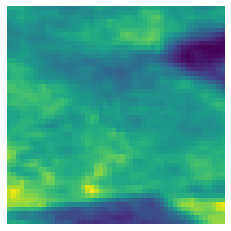

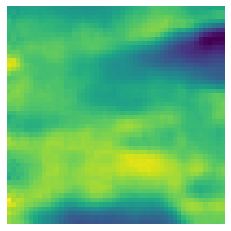

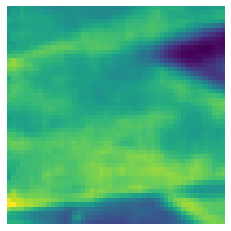

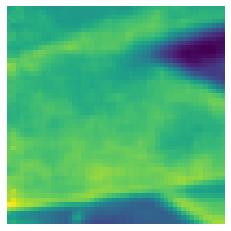

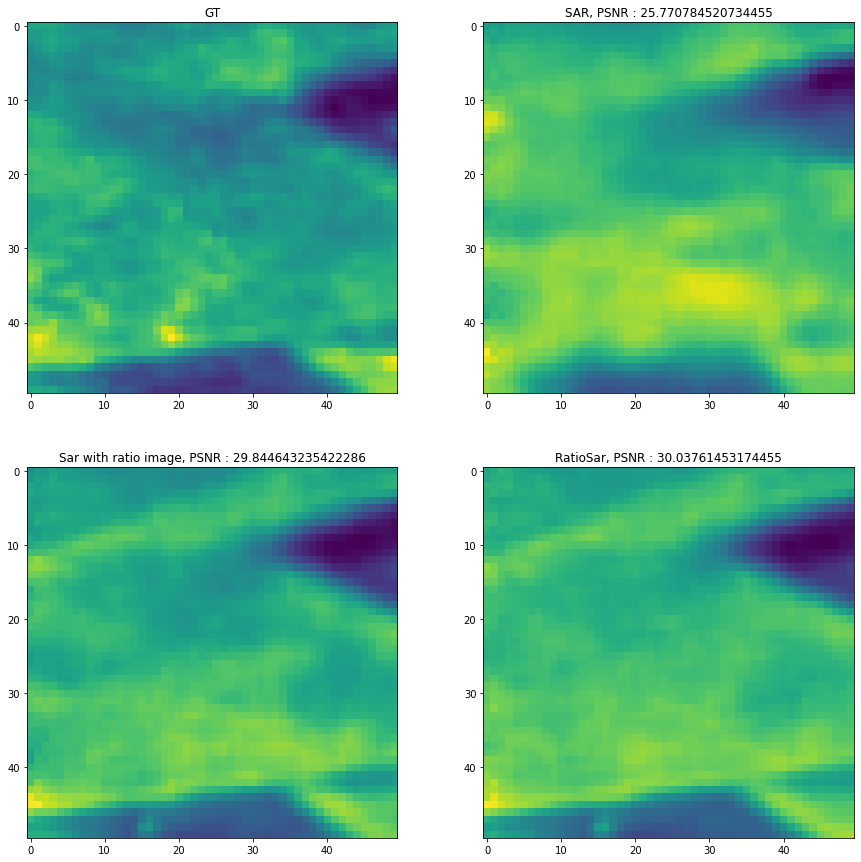

In [44]:
a = 75
b = 125
c = 0
d = 50

plt.imshow(im_gt_th[a:b,c:d])
plt.axis(False)
plt.show()

plt.imshow(im_sar_th[a:b,c:d])
plt.axis(False)
plt.show()

plt.imshow(im_sar_with_ratio_th[a:b,c:d])
plt.axis(False)
plt.show()

plt.imshow(im_ratiosar_th[a:b,c:d])
plt.axis(False)
plt.show()

fig, axs = plt.subplots(2, 2, figsize = (15,15))

axs[0,0].imshow(im_gt_th[a:b,c:d])
axs[0,0].set_title('GT')

axs[0,1].imshow(im_sar_th[a:b,c:d])
axs[0,1].set_title('SAR, PSNR : '+str(psnr_sar))

axs[1,0].imshow(im_sar_with_ratio_th[a:b,c:d])
axs[1,0].set_title('Sar with ratio image, PSNR : '+str(psnr_sar_with_ratio))

axs[1,1].imshow(im_ratiosar_th[a:b,c:d])
axs[1,1].set_title('RatioSar, PSNR : '+str(psnr_ratiosar))

plt.show()

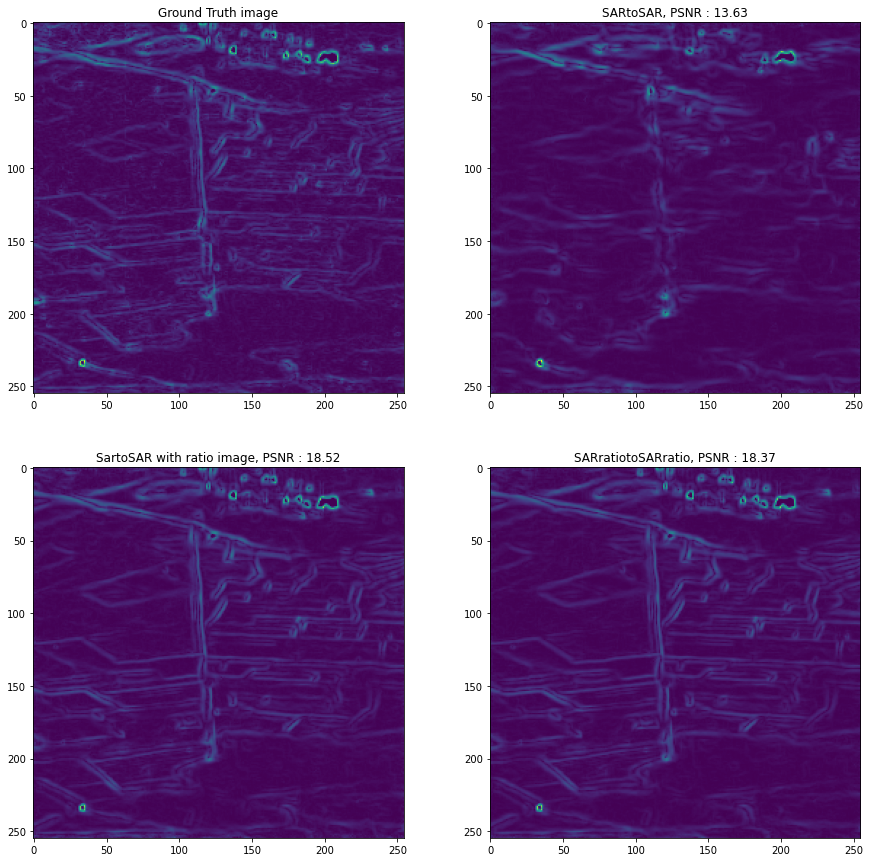

In [45]:
fig, axs = plt.subplots(2, 2, figsize = (15,15))

axs[0,0].imshow(gradn(im_gt_th))
axs[0,0].set_title('Ground Truth image')

axs[0,1].imshow(gradn(im_sar_th))
axs[0,1].set_title('SARtoSAR, PSNR : '+str(cal_psnr(gradn(im_sartosar), gradn(im_gt)))[:5])

axs[1,0].imshow(gradn(im_sar_with_ratio_th))
axs[1,0].set_title('SartoSAR with ratio image, PSNR : '+str(cal_psnr(gradn(im_sartosar_with_ratio), gradn(im_gt)))[:5])

axs[1,1].imshow(gradn(im_ratiosar_th))
axs[1,1].set_title('SARratiotoSARratio, PSNR : '+str(cal_psnr(gradn(im_ratiosar), gradn(im_gt)))[:5])

plt.show()

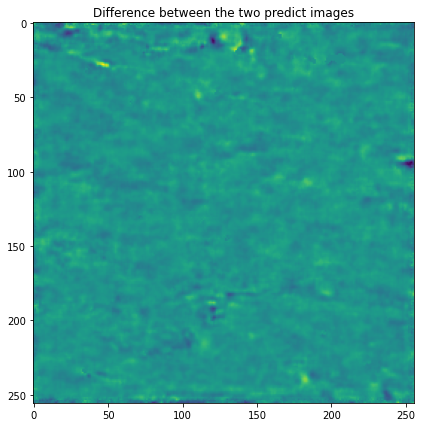

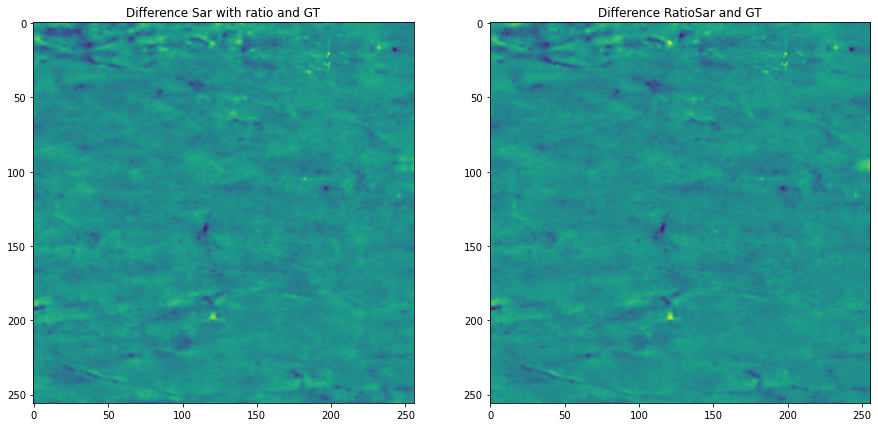

In [46]:
plt.figure(figsize=(7,7))
plt.title('Difference between the two predict images')
plt.imshow(im_sar_with_ratio_th-im_ratiosar_th)
plt.show()

fig, axs = plt.subplots(1, 2, figsize = (15,15))

axs[0].imshow(im_sar_with_ratio_th-im_gt_th)
axs[0].set_title('Difference Sar with ratio and GT')

axs[1].imshow(im_ratiosar_th-im_gt_th)
axs[1].set_title('Difference RatioSar and GT')

plt.show()

## With the real super-image

In [47]:
# Now if the super image is made from noisy images
# Create ratio image with normalized super-image
super_image_noisy = super_image.detach().numpy().astype(np.float32)
super_image_lee = Lee_filter(super_image_noisy, L = 10).astype(np.float32)

In [48]:
#test for denoising the noisy super-image
super_image_BM3D = denoise_BM3D(super_image_noisy, BM3DDenoiser)

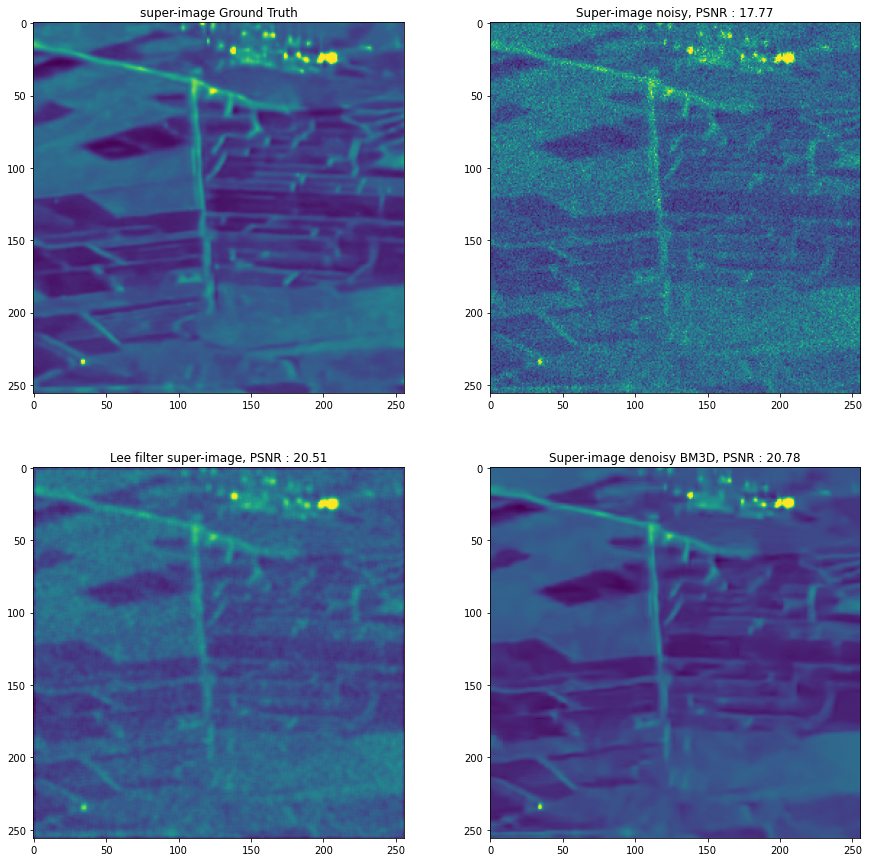

In [75]:
fig, axs = plt.subplots(2, 2, figsize = (15,15))

axs[0,0].imshow(threshold(super_image_gt, name))
axs[0,0].set_title('super-image Ground Truth')

axs[0,1].imshow(threshold(super_image_noisy, name))
axs[0,1].set_title(f'Super-image noisy, PSNR : '+str(cal_psnr(super_image_noisy, super_image_gt))[:5])

axs[1,0].imshow(threshold(super_image_lee, name))
axs[1,0].set_title(f'Lee filter super-image, PSNR : '+str(cal_psnr(super_image_lee, super_image_gt))[:5])

axs[1,1].imshow(threshold(super_image_BM3D, name))
axs[1,1].set_title(f'Super-image denoisy BM3D, PSNR : '+str(cal_psnr(super_image_BM3D, super_image_gt))[:5])

plt.show()

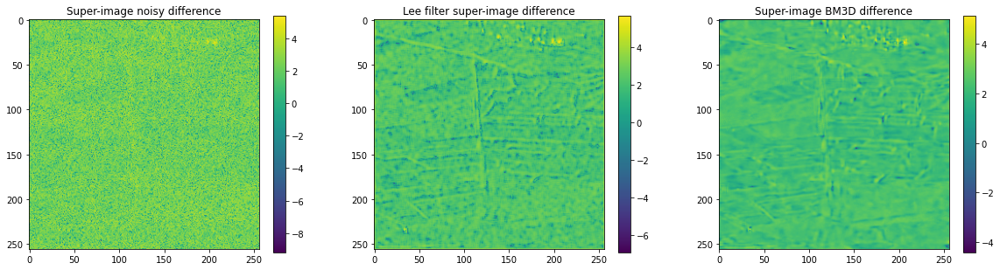

In [77]:
fig, axs = plt.subplots(1, 3, figsize = (20,5))

im0 = axs[0].imshow(np.log(np.abs(super_image_noisy - super_image_gt)))
fig.colorbar(im0, ax=axs[0])
axs[0].set_title(f'Super-image noisy difference')

im1 = axs[1].imshow(np.log(np.abs(super_image_lee - super_image_gt)))
fig.colorbar(im1, ax=axs[1])
axs[1].set_title(f'Lee filter super-image difference')

im2 = axs[2].imshow(np.log(np.abs(super_image_BM3D - super_image_gt)))
fig.colorbar(im2, ax=axs[2])
axs[2].set_title(f'Super-image BM3D difference')

plt.show()

In [50]:
# Denoising
im_sartosar = denoiser_256(im_noisy, model)
im_sartosar_with_ratio_noisy = sar_to_sar_with_ratio(im_noisy, super_image_noisy, model)
im_ratiosar_noisy =  sarratio_to_sarratio(im_noisy, super_image_noisy, model_ratio)
im_sartosar_with_ratio_lee = sar_to_sar_with_ratio(im_noisy, super_image_lee, model)
im_ratiosar_lee =  sarratio_to_sarratio(im_noisy, super_image_lee, model_ratio)
im_sartosar_with_ratio_BM3D = sar_to_sar_with_ratio(im_noisy, super_image_BM3D, model)
im_ratiosar_BM3D =  sarratio_to_sarratio(im_noisy, super_image_BM3D, model_ratio)
im_sartosar_with_ratio_gt = sar_to_sar_with_ratio(im_noisy, super_image_gt, model)
im_ratiosar_gt =  sarratio_to_sarratio(im_noisy, super_image_gt, model_ratio)

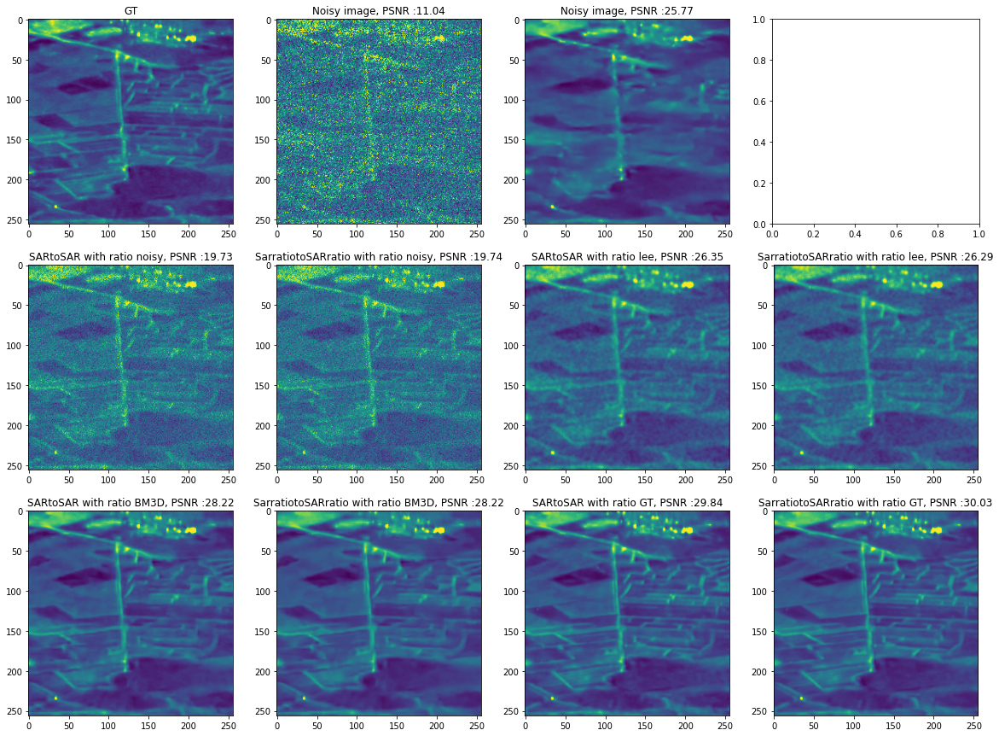

In [58]:
#All methods
fig, axs = plt.subplots(3, 4, figsize = (20,15))

axs[0,0].imshow(threshold(im_gt, name))
axs[0,0].set_title('GT')

axs[0,1].imshow(threshold(im_noisy, name))
axs[0,1].set_title(f'Noisy image, PSNR :'+ str(cal_psnr(im_noisy, im_gt))[:5])

axs[0,2].imshow(threshold(im_sartosar, name))
axs[0,2].set_title(f'Noisy image, PSNR :'+ str(cal_psnr(im_sartosar, im_gt))[:5])

axs[1,0].imshow(threshold(im_sartosar_with_ratio_noisy, name))
axs[1,0].set_title(f'SARtoSAR with ratio noisy, PSNR :'+ str(cal_psnr(im_sartosar_with_ratio_noisy, im_gt))[:5])

axs[1,1].imshow(threshold(im_ratiosar_noisy, name))
axs[1,1].set_title(f'SarratiotoSARratio with ratio noisy, PSNR :'+ str(cal_psnr(im_ratiosar_noisy, im_gt))[:5])

axs[1,2].imshow(threshold(im_sartosar_with_ratio_lee, name))
axs[1,2].set_title(f'SARtoSAR with ratio lee, PSNR :'+ str(cal_psnr(im_sartosar_with_ratio_lee, im_gt))[:5])

axs[1,3].imshow(threshold(im_ratiosar_lee, name))
axs[1,3].set_title(f'SarratiotoSARratio with ratio lee, PSNR :'+ str(cal_psnr(im_ratiosar_lee, im_gt))[:5])

axs[2,0].imshow(threshold(im_sartosar_with_ratio_BM3D, name))
axs[2,0].set_title(f'SARtoSAR with ratio BM3D, PSNR :'+ str(cal_psnr(im_sartosar_with_ratio_BM3D, im_gt))[:5])

axs[2,1].imshow(threshold(im_ratiosar_BM3D, name))
axs[2,1].set_title(f'SarratiotoSARratio with ratio BM3D, PSNR :'+ str(cal_psnr(im_ratiosar_BM3D, im_gt))[:5])

axs[2,2].imshow(threshold(im_sartosar_with_ratio_gt, name))
axs[2,2].set_title(f'SARtoSAR with ratio GT, PSNR :'+ str(cal_psnr(im_sartosar_with_ratio_gt, im_gt))[:5])

axs[2,3].imshow(threshold(im_ratiosar_gt, name))
axs[2,3].set_title(f'SarratiotoSARratio with ratio GT, PSNR :'+ str(cal_psnr(im_ratiosar_gt, im_gt))[:5])

plt.show()

# Comparison between methods
We compute quantitative comparison between the different methods

In [31]:
psnr = np.zeros((len(super_resolution_list), 10, 10))
psnr_g = np.zeros((len(super_resolution_list), 10, 10))

for k in range(len(super_resolution_list)):
  #import the stack k
  super_image_noisy = super_resolution_list[k].detach().numpy()
  super_image_gt = super_resolution_gt_list[k]
  Im_gt = Im_gt_list[k]
  Im_ratio = Im_ratio_list[k]
  Im_ratio_gt = Im_ratio_gt_list[k]
  Im_noisy = Im_noisy_list[k]

  super_image_lee = Lee_filter(super_image_noisy, 10, 4)
  super_image_BM3D = denoise_BM3D(super_image_noisy, BM3DDenoiser)

  for i in range(10):
    im_noisy = Im_noisy[i, :, :].detach().numpy()
    im_denoised_sar = denoiser_256(im_noisy.astype(np.float32), model)

    #without denoising on the super-image
    im_sartosar_with_ratio_noisy =  sar_to_sar_with_ratio(im_noisy, super_image_noisy, model)
    im_ratiosar_noisy =  sarratio_to_sarratio(im_noisy, super_image_noisy, model_ratio)
    
    #with a perfect denoising on the super-image
    im_sartosar_with_ratio_gt = sar_to_sar_with_ratio(im_noisy, super_image_gt, model)
    im_ratiosar_gt = sarratio_to_sarratio(im_noisy, super_image_gt, model_ratio)

    #with a Lee filter on the super-image
    im_sartosar_with_ratio_lee = sar_to_sar_with_ratio(im_noisy, super_image_lee, model)
    im_ratiosar_lee =  sarratio_to_sarratio(im_noisy, super_image_lee, model_ratio)

    #with a Lee filter on the super-image
    im_sartosar_with_ratio_BM3D = sar_to_sar_with_ratio(im_noisy, super_image_BM3D, model)
    im_ratiosar_BM3D =  sarratio_to_sarratio(im_noisy, super_image_BM3D, model_ratio)

    im_gt = Im_gt[i,:,:]

    # calculate PSNR
    psnr[k, i, 0] = cal_psnr(im_noisy, im_gt).astype(np.float32)
    psnr[k, i, 1] = cal_psnr(im_sartosar_with_ratio_noisy, im_gt).astype(np.float32)
    psnr[k, i, 2] = cal_psnr(im_ratiosar_noisy, im_gt).astype(np.float32)
    psnr[k, i, 3] = cal_psnr(im_sartosar_with_ratio_gt, im_gt).astype(np.float32)
    psnr[k, i, 4] = cal_psnr(im_ratiosar_gt, im_gt).astype(np.float32)
    psnr[k, i, 5] = cal_psnr(im_sartosar_with_ratio_denoisy, im_gt).astype(np.float32)
    psnr[k, i, 6] = cal_psnr(im_ratiosar_denoisy, im_gt).astype(np.float32)
    psnr[k, i, 7] = cal_psnr(im_sartosar_with_ratio_BM3D, im_gt).astype(np.float32)
    psnr[k, i, 8] = cal_psnr(im_ratiosar_BM3D, im_gt).astype(np.float32)
    psnr[k, i, 9] = cal_psnr(im_denoised_sar, im_gt).astype(np.float32)

    im_gt_g = gradn(im_gt)
    im_noisy_g = gradn(im_noisy)
    im_sartosar_with_ratio_noisy_g = gradn(im_sartosar_with_ratio_noisy)
    im_ratiosar_noisy_g = gradn(im_ratiosar_noisy)
    im_sartosar_with_ratio_gt_g = gradn(im_sartosar_with_ratio_gt)
    im_ratiosar_gt_g = gradn(im_ratiosar_gt)
    im_sartosar_with_ratio_denoisy_g = gradn(im_sartosar_with_ratio_denoisy)
    im_ratiosar_denoisy_g = gradn(im_ratiosar_denoisy)
    im_sartosar_with_ratio_BM3D_g = gradn(im_sartosar_with_ratio_BM3D)
    im_ratiosar_BM3D_g = gradn(im_ratiosar_BM3D)
    im_denoised_sar_g = gradn(im_denoised_sar)

    psnr_g[k, i, 0] = cal_psnr(im_noisy_g, im_gt_g).astype(np.float32)
    psnr_g[k, i, 1] = cal_psnr(im_sartosar_with_ratio_noisy_g, im_gt_g).astype(np.float32)
    psnr_g[k, i, 2] = cal_psnr(im_ratiosar_noisy_g, im_gt_g).astype(np.float32)
    psnr_g[k, i, 3] = cal_psnr(im_sartosar_with_ratio_gt_g, im_gt_g).astype(np.float32)
    psnr_g[k, i, 4] = cal_psnr(im_ratiosar_gt_g, im_gt_g).astype(np.float32)
    psnr_g[k, i, 5] = cal_psnr(im_sartosar_with_ratio_denoisy_g, im_gt_g).astype(np.float32)
    psnr_g[k, i, 6] = cal_psnr(im_ratiosar_denoisy_g, im_gt_g).astype(np.float32)
    psnr_g[k, i, 7] = cal_psnr(im_sartosar_with_ratio_BM3D_g, im_gt_g).astype(np.float32)
    psnr_g[k, i, 8] = cal_psnr(im_ratiosar_BM3D_g, im_gt_g).astype(np.float32)
    psnr_g[k, i, 9] = cal_psnr(im_denoised_sar_g, im_gt_g).astype(np.float32)

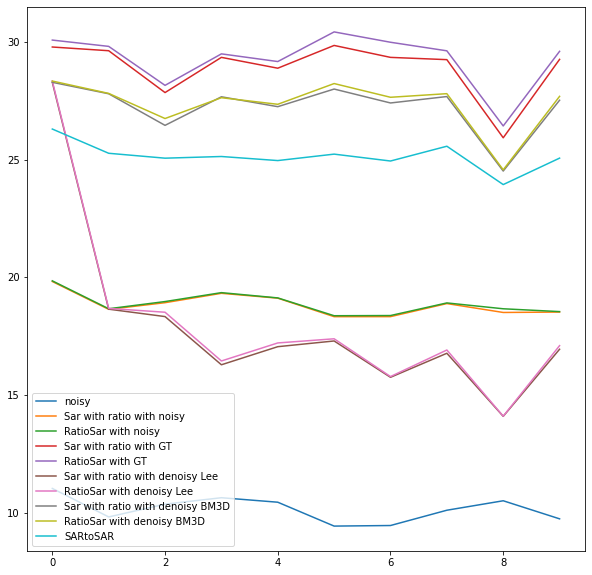

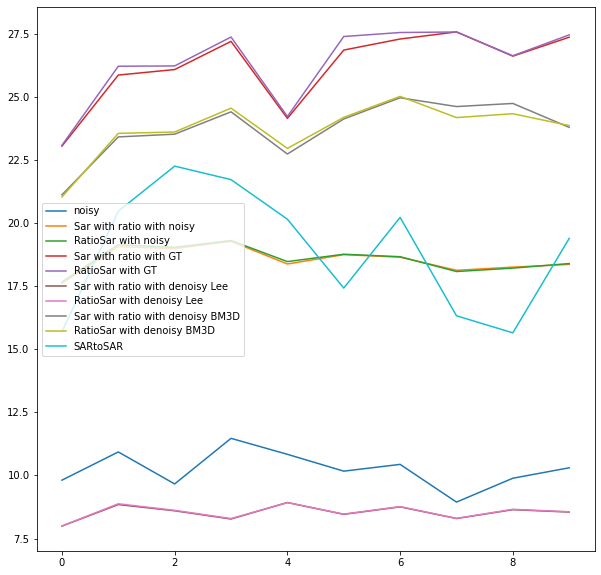

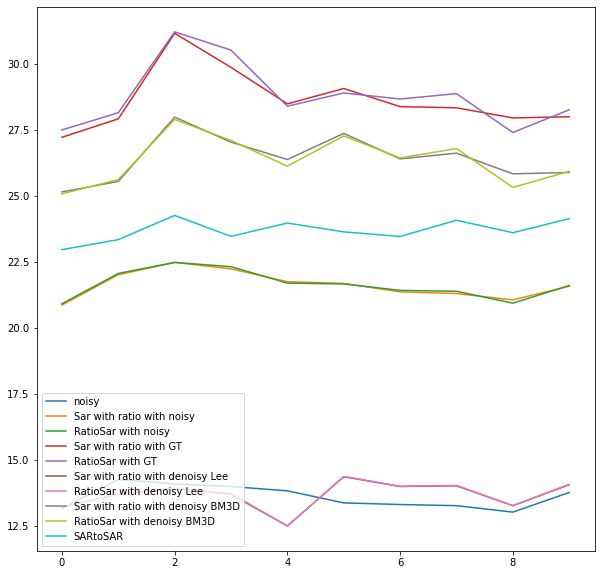

In [32]:
for k in range(3):
  plt.figure(figsize=(10,10))
  plt.plot(psnr[k, :, 0], label='noisy')
  plt.plot(psnr[k, :, 1], label='Sar with ratio with noisy')
  plt.plot(psnr[k, :, 2], label='RatioSar with noisy')
  plt.plot(psnr[k, :, 3], label='Sar with ratio with GT')
  plt.plot(psnr[k, :, 4], label='RatioSar with GT')
  plt.plot(psnr[k, :, 5], label='Sar with ratio with denoisy Lee')
  plt.plot(psnr[k, :, 6], label='RatioSar with denoisy Lee')
  plt.plot(psnr[k, :, 7], label='Sar with ratio with denoisy BM3D')
  plt.plot(psnr[k, :, 8], label='RatioSar with denoisy BM3D')
  plt.plot(psnr[k, :, 9], label='SARtoSAR')
  plt.legend(loc='best')
  plt.show()

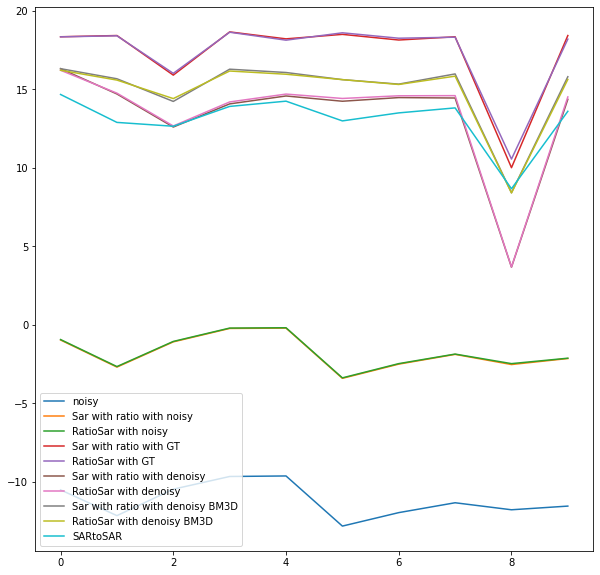

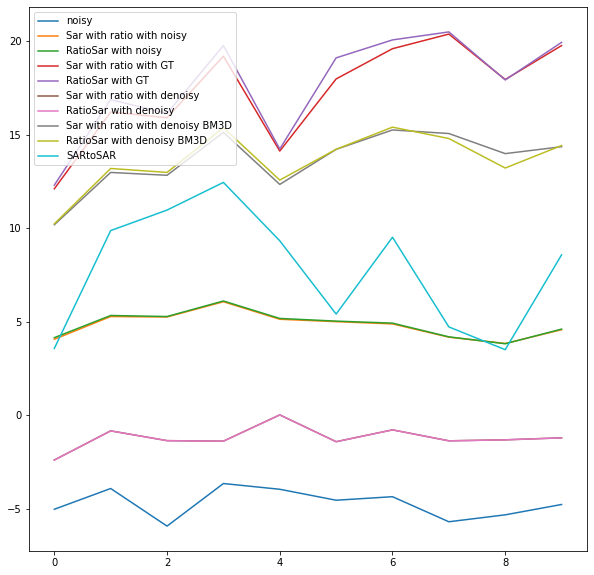

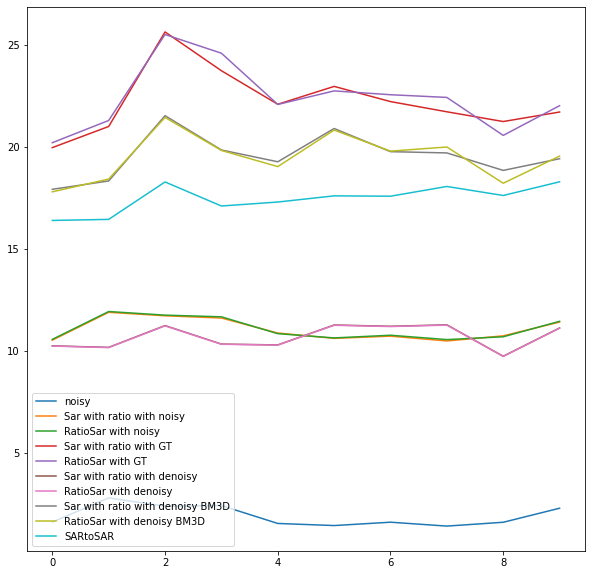

In [33]:
for k in range(3):
  plt.figure(figsize=(10,10))
  plt.plot(psnr_g[k, :, 0], label='noisy')
  plt.plot(psnr_g[k, :, 1], label='Sar with ratio with noisy')
  plt.plot(psnr_g[k, :, 2], label='RatioSar with noisy')
  plt.plot(psnr_g[k, :, 3], label='Sar with ratio with GT')
  plt.plot(psnr_g[k, :, 4], label='RatioSar with GT')
  plt.plot(psnr_g[k, :, 5], label='Sar with ratio with denoisy')
  plt.plot(psnr_g[k, :, 6], label='RatioSar with denoisy')
  plt.plot(psnr_g[k, :, 7], label='Sar with ratio with denoisy BM3D')
  plt.plot(psnr_g[k, :, 8], label='RatioSar with denoisy BM3D')
  plt.plot(psnr_g[k, :, 9], label='SARtoSAR')
  plt.legend(loc='best')
  plt.show()

In [34]:
for i in range(10):
  print('$' + str(int(100*np.mean(psnr, axis = (0,1))[i])/100) + ' \pm ' + str(int(100*np.std(psnr, axis = (0,1))[i])/100) + '$')

$11.34 \pm 1.7$
$19.67 \pm 1.47$
$19.7 \pm 1.46$
$27.91 \pm 1.72$
$28.13 \pm 1.78$
$13.39 \pm 4.4$
$13.43 \pm 4.43$
$25.8 \pm 1.79$
$25.81 \pm 1.82$
$22.58 \pm 3.0$


In [35]:
for i in range(10):
  print('$' + str(int(100*np.mean(psnr_g, axis = (0,1))[i])/100) + ' \pm ' + str(int(100*np.std(psnr_g, axis = (0,1))[i])/100) + '$')

$-4.67 \pm 5.4$
$4.7 \pm 5.29$
$4.73 \pm 5.29$
$18.95 \pm 3.23$
$19.14 \pm 3.21$
$7.61 \pm 6.62$
$7.63 \pm 6.64$
$16.05 \pm 3.03$
$16.01 \pm 3.01$
$12.78 \pm 4.44$


# Comparison between ratio images distributions and Natural SAR image distribution
Not a good normalization.
We look at the difference of the distribution in the log domain, to justify if the change of mean and variance is enough.

Original distributions :

In [69]:
#In the ideal case -> to understand what we are doing
Im_ratio_norm_gt_list = []

for i in range(3):
  super_resolution_gt = super_resolution_gt_list[i]
  Im_gt = Im_gt_list[i]

  #computation normalized ratio 
  super_image_gt = super_resolution_gt
  super_image_gt_log = np.log(super_image_gt + 1e-6)
  lbda = np.exp(np.mean(super_image_gt_log))
  super_im_gt_norm = super_image_gt / lbda
  Im_ratio_norm_gt_list.append(Im_gt / super_im_gt_norm)

#Selected one of the three stack
i = 0
super_resolution_gt = super_resolution_gt_list[i]
Im_gt = Im_gt_list[i]
Im_ratio_gt = Im_ratio_gt_list[i]
Im_ratio_norm_gt = Im_ratio_norm_gt_list[i]

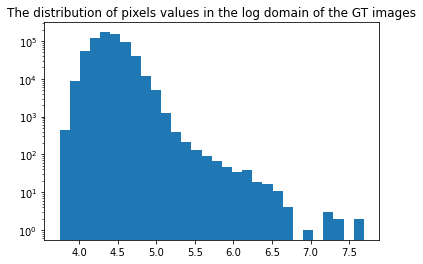

In [70]:
Im_gt_dist = np.log(Im_gt + 1e-6).reshape(-1)
plt.hist(Im_gt_dist, bins = 30)
plt.yscale('log')
plt.title('The distribution of pixels values in the log domain of the GT images')
plt.show()

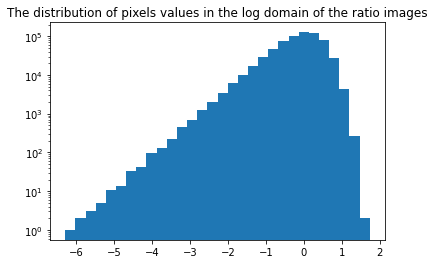

In [71]:
Im_ratio_dist = torch.log(Im_ratio + 1e-6).detach().numpy().reshape(-1)
plt.hist(Im_ratio_dist, bins = 30)
plt.yscale('log')
plt.title('The distribution of pixels values in the log domain of the ratio images')
plt.show()

After the re-normalization

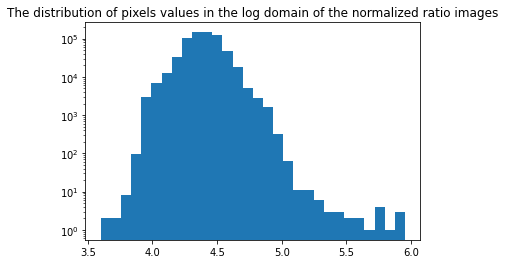

In [74]:
Im_ratio_norm_dist = np.log(Im_ratio_norm_gt + 1e-6).reshape(-1)
plt.hist(Im_ratio_norm_dist, bins = 30)
plt.yscale('log')
plt.title('The distribution of pixels values in the log domain of the normalized ratio images')
plt.show()

In [75]:
print(np.mean(Im_ratio_norm_dist))
print(np.mean(Im_gt_dist))
print(np.std(Im_ratio_norm_dist))
print(np.std(Im_gt_dist))

4.395552729292629
4.395552717064864
0.1348083426113455
0.2046162763816104


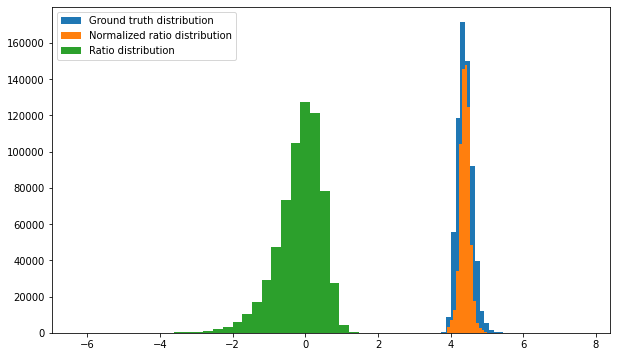

In [91]:
plt.figure(figsize=(10,6))
plt.hist(Im_gt_dist, bins = 30, label = "Ground truth distribution")
plt.hist(Im_ratio_norm_dist, bins = 30, label = 'Normalized ratio distribution')
plt.hist(Im_ratio_dist, bins = 30, label = 'Ratio distribution')
plt.legend()
# plt.title('Pixels values distributions')
plt.show()

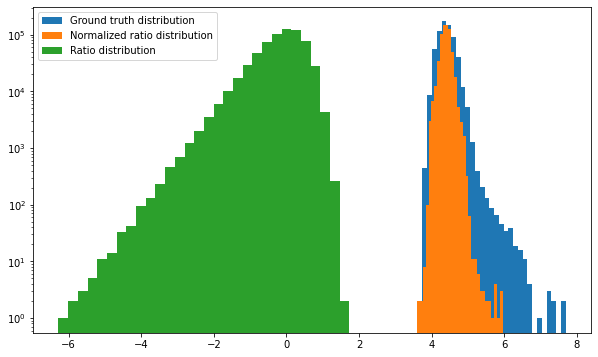

In [92]:
plt.figure(figsize=(10,6))
plt.hist(Im_gt_dist, bins = 30, label = "Ground truth distribution")
plt.hist(Im_ratio_norm_dist, bins = 30, label = 'Normalized ratio distribution')
plt.hist(Im_ratio_dist, bins = 30, label = 'Ratio distribution')
plt.legend()
plt.yscale('log')
# plt.title('Pixels values distributions in the log domain')
plt.show()